**Basics of image**

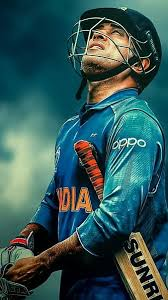

[[ 29  29  30 ... 161 161 161]
 [ 29  29  30 ... 160 160 160]
 [ 31  31  31 ... 160 160 159]
 ...
 [ 20  69  62 ... 107  88 100]
 [ 24  61   4 ...  90 112 107]
 [ 12  71   4 ...  90 101  84]]
(300, 168)


array([[ 29,  29,  29, ..., 161, 161, 161],
       [ 29,  29,  29, ..., 160, 160, 160],
       [ 30,  30,  30, ..., 160, 160, 160],
       ...,
       [ 23,  28,  45, ..., 104, 104, 104],
       [ 20,  25,  44, ..., 104, 100,  98],
       [ 12,  19,  44, ...,  93,  86,  84]], dtype=uint8)
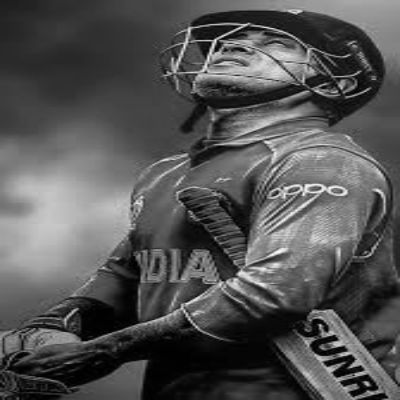

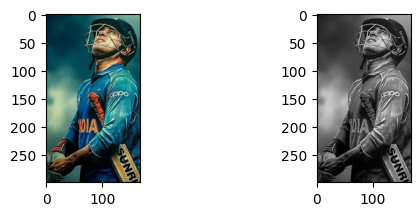

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
img=cv.imread('/content/MSD.jpg') #img is a matrix of numbers
cv2_imshow(img)

img=cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.subplot(2,2,1)
plt.imshow(img)

img=cv.cvtColor(img,cv.COLOR_BGR2GRAY)
print(img)

Shape_img=img.shape
print(Shape_img)

plt.subplot(2,2,2)
plt.imshow(img,cmap='gray')

cv.imwrite('P.jpg',img)

cv.resize(img,(400,400))


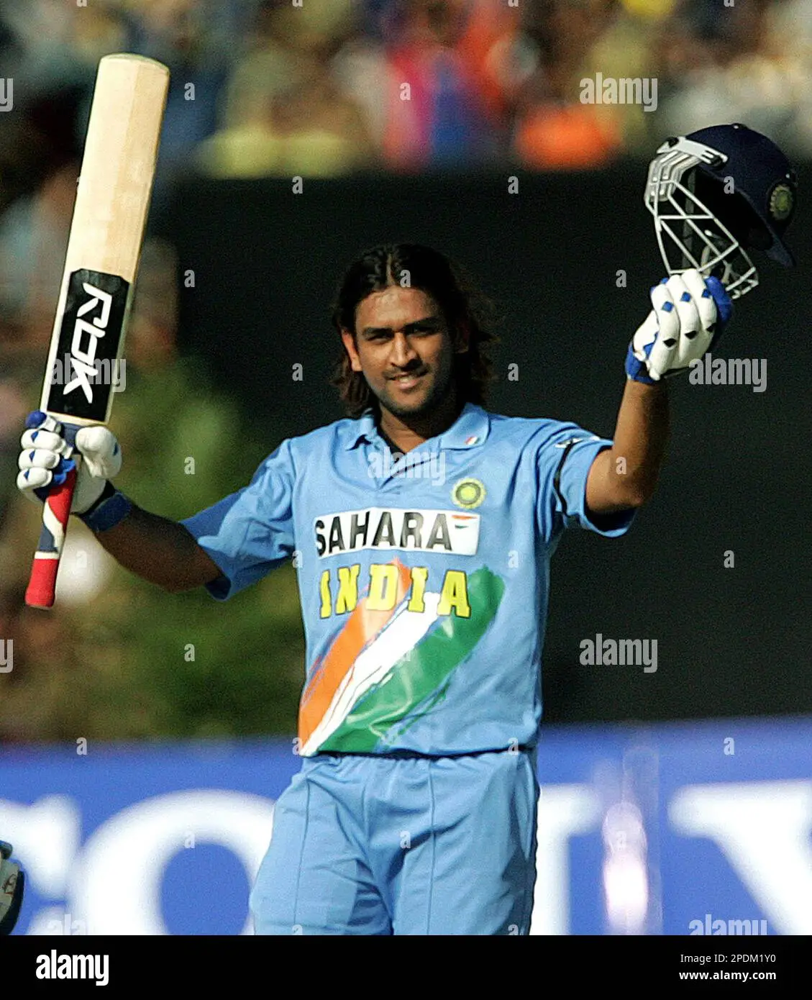

[[ 76  76  76 ... 155 163 164]
 [ 72  72  72 ... 158 162 162]
 [ 67  67  67 ... 162 160 161]
 ...
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]]
(1390, 1129)
original Dimensions : (1390, 1129)


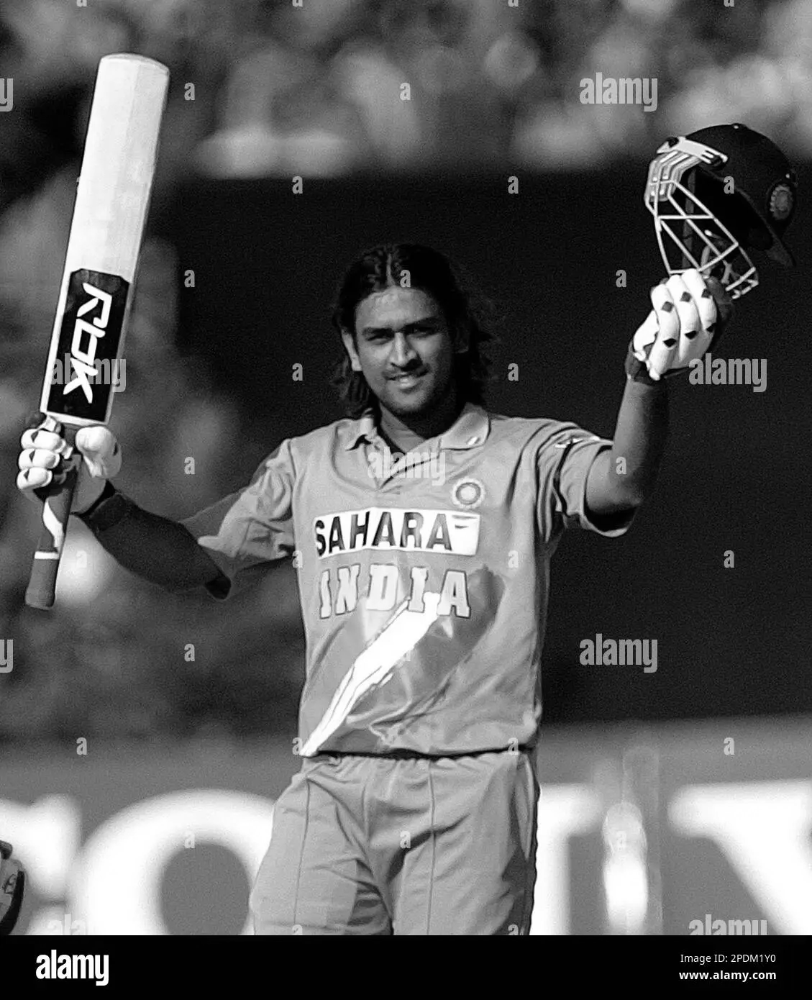

Resized Dimensions :  (834, 677)


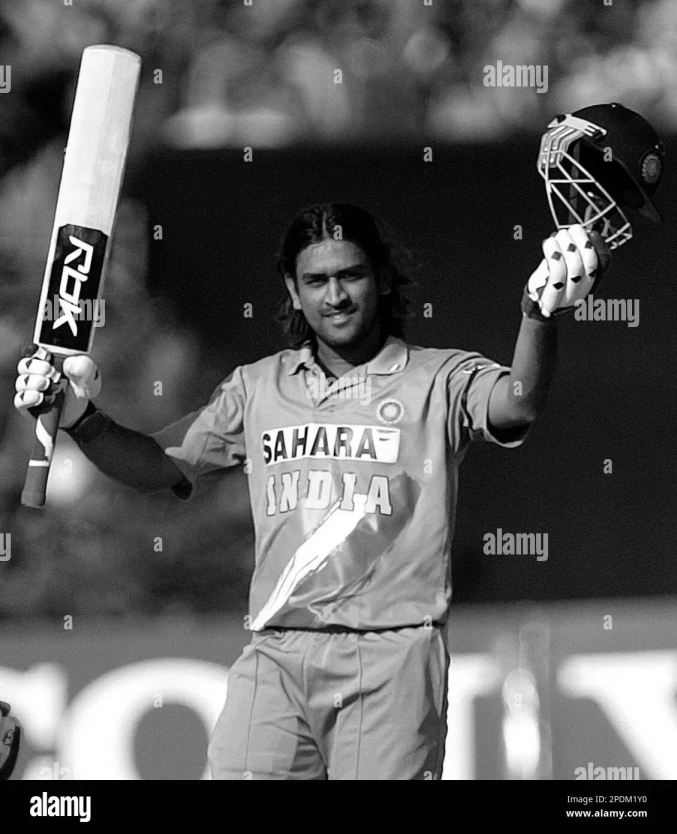

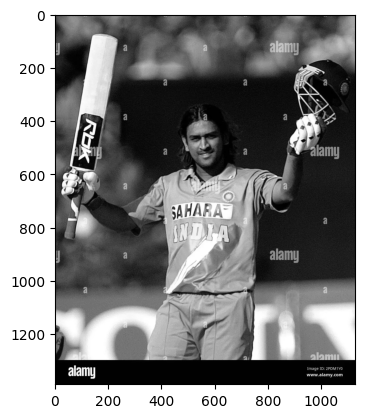

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img=cv.imread('/content/msd.webp')
cv2_imshow(img)


img=cv.cvtColor(img,cv.COLOR_BGR2GRAY)
print(img)
a=img.shape
print(a)
plt.imshow(img,cmap='gray')

print('original Dimensions :',img.shape)
cv2_imshow(img)
scale_percent = 60 # percent of original size
width = int (img.shape[1] * scale_percent / 100)
height = int (img.shape[0] * scale_percent / 100)
dim = (width, height)
# resize image
resized = cv.resize(img, dim, interpolation = cv.INTER_AREA)
print('Resized Dimensions : ',resized.shape)
cv2_imshow(resized)
cv.waitKey(0)
cv.destroyAllWindows()




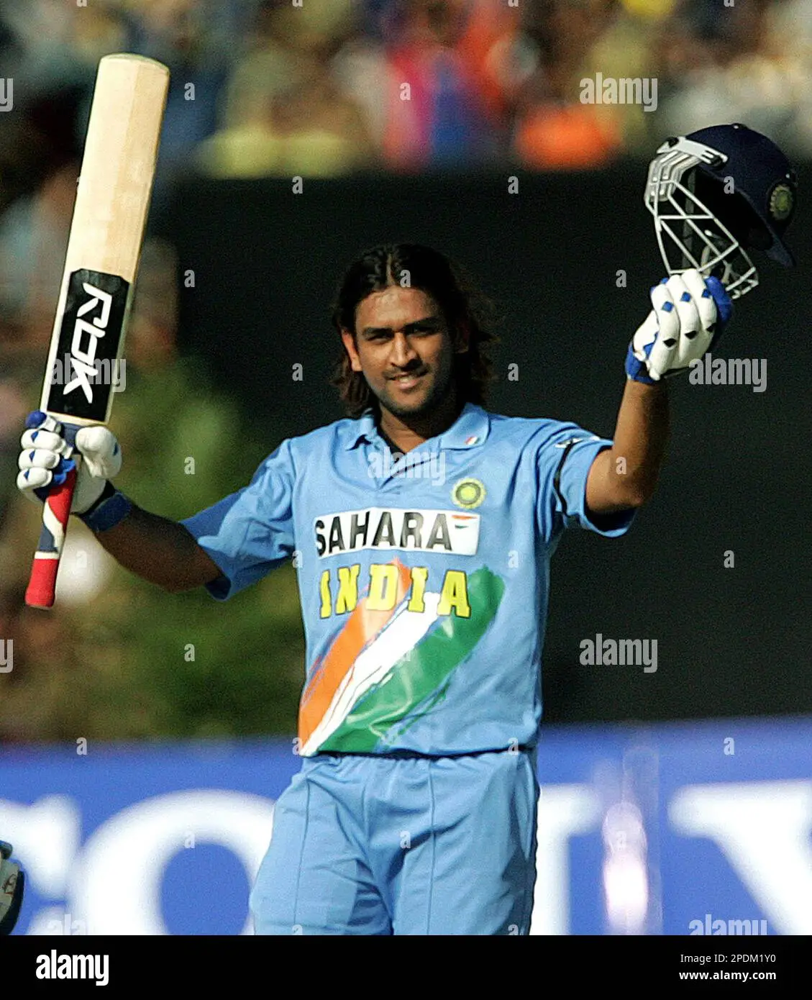

[[ 76  76  76 ... 155 163 164]
 [ 72  72  72 ... 158 162 162]
 [ 67  67  67 ... 162 160 161]
 ...
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]
 [  1   1   1 ...   1   1   1]]
(1390, 1129)


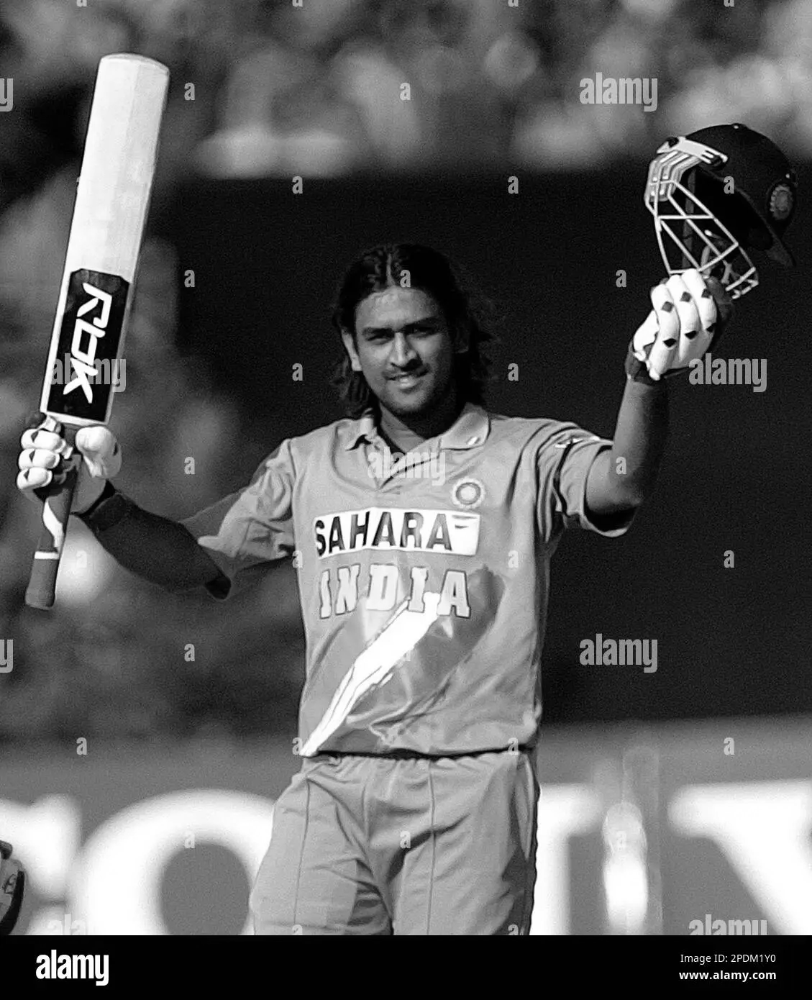

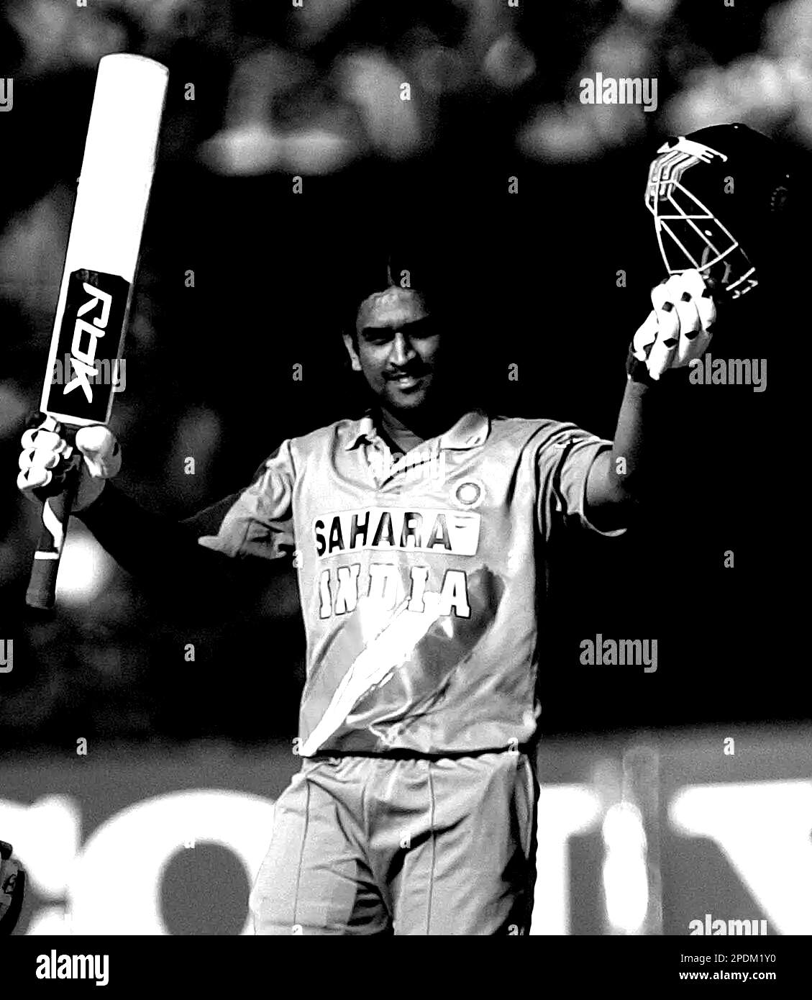

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img=cv.imread('/content/msd.webp')
cv2_imshow(img)

img =cv.cvtColor(img,cv.COLOR_BGR2GRAY)
print(img)
a=img.shape
print(a)

#FUNCTION TO MAP EACH INTENSITY LEVEL TO OUTPUT INTENSITY LEVEL
def pixelVal(pix,r1,s1,r2,s2):
  if  (0<=pix<=r1):
    return 0
  elif (r1<pix and pix <=r2):
    return ((pix-r1)*(s2-s1)/(r2-r1))+s1
  else:
    return 255

#Define parameters.
r1 =70
s1 = 0
r2 = 200
s2 = 255

#Vectorize the function to apply it to each value in the numpy array.
pixelVal_vec = np.vectorize(pixelVal)

#Apply contrast stretching.
contrast_stretch = pixelVal_vec(img,r1,s1,r2,s2)

cv2_imshow(img)
cv2_imshow(contrast_stretch)

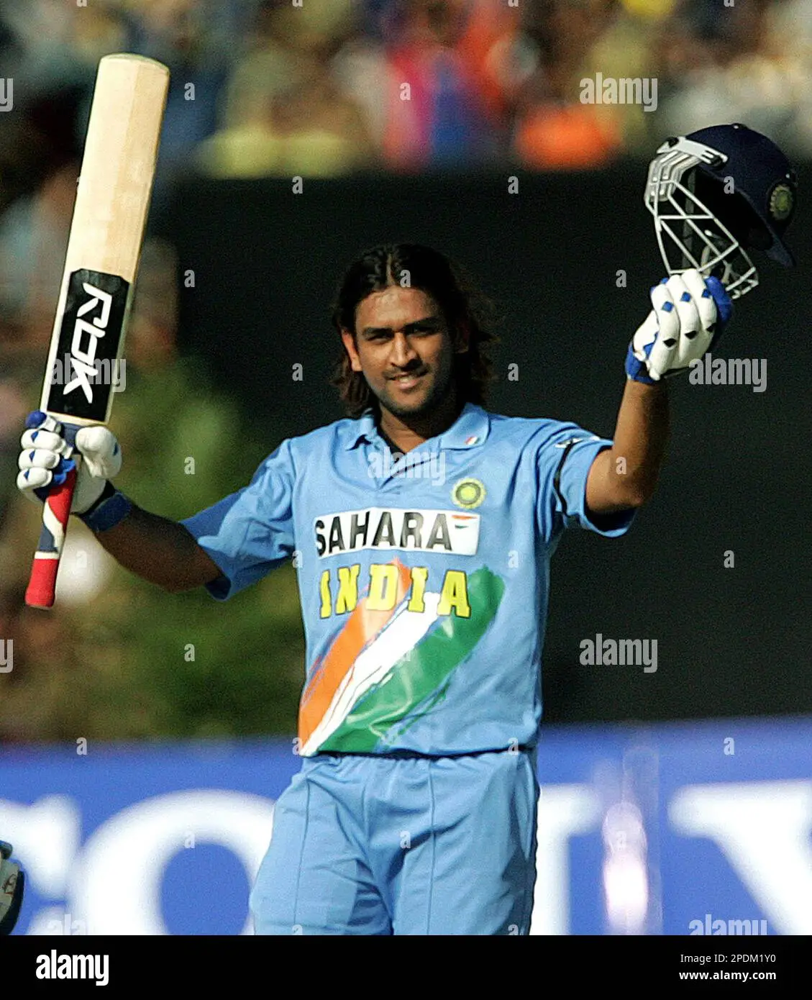

[[[ 68  81  69]
  [ 68  81  69]
  [ 68  81  69]
  ...
  [137 158 155]
  [145 167 163]
  [146 168 164]]

 [[ 64  77  66]
  [ 64  77  66]
  [ 64  77  66]
  ...
  [140 162 158]
  [144 165 162]
  [144 165 162]]

 [[ 59  72  61]
  [ 59  72  61]
  [ 59  72  61]
  ...
  [144 165 162]
  [141 163 160]
  [143 164 161]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[  1   1   1]
  [  1   1   1]
  [  1   1   1]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
(1390, 1129, 3)


<ipython-input-10-a5bc933f0fe4>:18: RuntimeWarning: divide by zero encountered in log
  log_img=c*(np.log(1+img))
<ipython-input-10-a5bc933f0fe4>:22: RuntimeWarning: invalid value encountered in cast
  log_img=np.array(log_img,dtype=np.uint8)


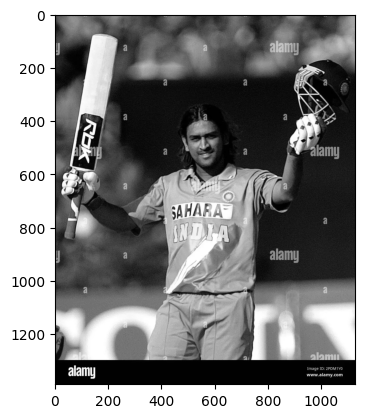

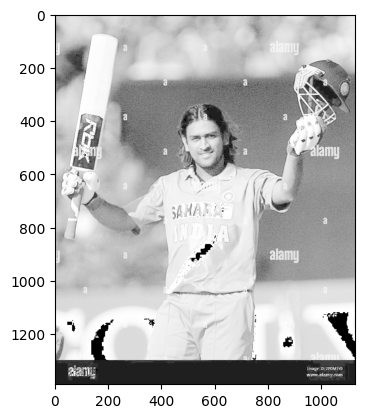

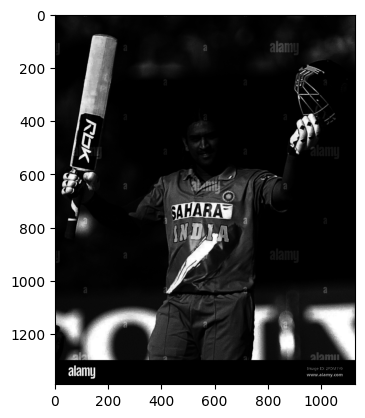

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img=cv.imread('/content/msd.webp')

cv2_imshow(img)

print(img)
a=img.shape
print(a)
img =cv.cvtColor(img,cv.COLOR_BGR2GRAY)
plt.imshow(img,cmap='gray')

#Apply log transformation
c=255/np.log(1+np.max(img))
log_img=c*(np.log(1+img))

#Specify thye datatype so that
#Float value will be converted to int
log_img=np.array(log_img,dtype=np.uint8)


invlog_image=(np.exp(img/c))-1


#Specify the datatype
invlog_image=np.array(invlog_image,dtype=np.uint8)

#Display images
plt.imshow(img,cmap='gray')
plt.show()
plt.imshow(log_img,cmap='gray')
plt.show()
plt.imshow(invlog_image,cmap='gray')
plt.show()


